In [1]:
from aicsimageio import AICSImage

# Cargar la imagen
filename = "gfap3.tif"
image = AICSImage(filename)

# Obtener shape y nombres de dimensiones
print("Shape de la imagen:", image.shape)  # Ejemplo: (T, C, Z, Y, X)
print("Nombres de dimensiones:", image.dims)  # Ejemplo: Dimensions [T: 1, C: 4, Z: 22, Y: 1024, X: 1024]

# Obtener tamaño de voxel y corregir manualmente el Z
voxel_size = image.physical_pixel_sizes  # Z, Y, X
corrected_voxel_size = (1.0, voxel_size.Y, voxel_size.X)  # Asumimos Z=1 µm

print("Tamaño de voxel corregido (Z, Y, X) en micrómetros:", corrected_voxel_size)

# Obtener el número de bits por píxel
dtype = image.data.dtype  # Tipo de dato de los píxeles (por ejemplo, uint8, uint16)
bits_per_pixel = dtype.itemsize * 8  # Calcular bits por píxel (1 byte = 8 bits)

print(f"Tipo de datos de la imagen: {dtype}")
print(f"Número de bits por píxel: {bits_per_pixel}")

05-Feb-25 15:23:37 - bfio.backends - WARNING  - Java backend is not available. This could be due to a missing dependency (jpype).


Shape de la imagen: (1, 2, 26, 1024, 1024)
Nombres de dimensiones: <Dimensions [T: 1, C: 2, Z: 26, Y: 1024, X: 1024]>
Tamaño de voxel corregido (Z, Y, X) en micrómetros: (1.0, 0.296523587116999, 0.296523587116999)
Tipo de datos de la imagen: uint16
Número de bits por píxel: 16


Shape de los datos (C, Z, Y, X): (2, 26, 1024, 1024)
Imagen convertida a 8 bits


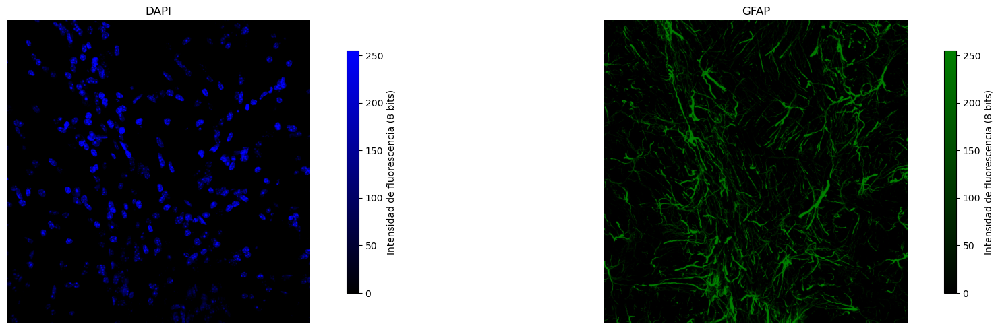

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from aicsimageio import AICSImage
from matplotlib.colors import LinearSegmentedColormap

# Crear colormaps personalizados
black_to_blue = LinearSegmentedColormap.from_list("black_to_blue", ["black", "blue"])
black_to_green = LinearSegmentedColormap.from_list("black_to_green", ["black", "green"])

# Cargar la imagen
filename = "gfap3.tif"
image = AICSImage(filename)

# Obtener los datos en formato numpy array (CZYX para cada canal)
data = image.get_image_data("CZYX", T=0)  # Seleccionamos T=0 si es una imagen 4D
print("Shape de los datos (C, Z, Y, X):", data.shape)

# Convertir la imagen de 16 bits a 8 bits
data_8bit = (data / data.max() * 255).astype(np.uint8)  # Escalar al rango 0-255
print("Imagen convertida a 8 bits")

# Colormaps personalizados para cada canal
channel_colormaps = [
    black_to_blue,  # Black to blue (DAPI)
    black_to_green, # Black to green (GFAP)
]

# Nombres de los canales
channel_names = ["DAPI", "GFAP"]

# Proyección Z y visualización
fig, axes = plt.subplots(1, 2, figsize=(20, 5))
for channel_index, (cmap, name) in enumerate(zip(channel_colormaps, channel_names)):
    # Proyección Z (máximo de intensidad a lo largo del eje Z)
    z_projection = np.max(data_8bit[channel_index], axis=0)
    
    # Mostrar el canal con el colormap personalizado
    im = axes[channel_index].imshow(z_projection, cmap=cmap)
    axes[channel_index].set_title(name)  # Usar el nombre del canal como título
    axes[channel_index].axis("off")
    
    # Agregar barra de color para mostrar el rango de intensidad
    cbar = plt.colorbar(im, ax=axes[channel_index], shrink=0.8)
    cbar.set_label("Intensidad de fluorescencia (8 bits)")

plt.tight_layout()
plt.show()

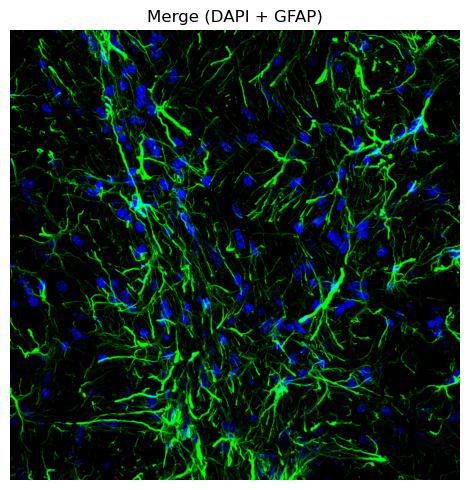

In [3]:
# Crear el merge entre ambos canales
dapi_projection = np.max(data_8bit[0], axis=0)  # Canal DAPI (Azul)
gfap_projection = np.max(data_8bit[1], axis=0)  # Canal GFAP (Verde)

# Crear una imagen RGB combinando ambos canales
rgb_merge = np.zeros((dapi_projection.shape[0], dapi_projection.shape[1], 3), dtype=np.uint8)
rgb_merge[..., 1] = gfap_projection  # GFAP en el canal rojo (verde en RGB)
rgb_merge[..., 2] = dapi_projection  # DAPI en el canal azul

# Visualizar el merge
plt.figure(figsize=(5, 5))
plt.imshow(rgb_merge)
plt.title("Merge (DAPI + GFAP)")
plt.axis("off")
plt.tight_layout()
plt.show()

Diámetro estimado en píxeles (XY): 26.98
Diámetro estimado en píxeles (Z): 8.00
Shape de la imagen 3D (Z, Y, X): (26, 1024, 1024)


C:\Users\Esteban Diaz\anaconda3\envs\bioimaging\lib\site-packages\cellpose\resnet_torch.py:275: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(filenam

Número total de núcleos detectados: 623
Volumen promedio de los núcleos: 13.28 µm³
Desviación estándar del volumen: 15.45 µm³


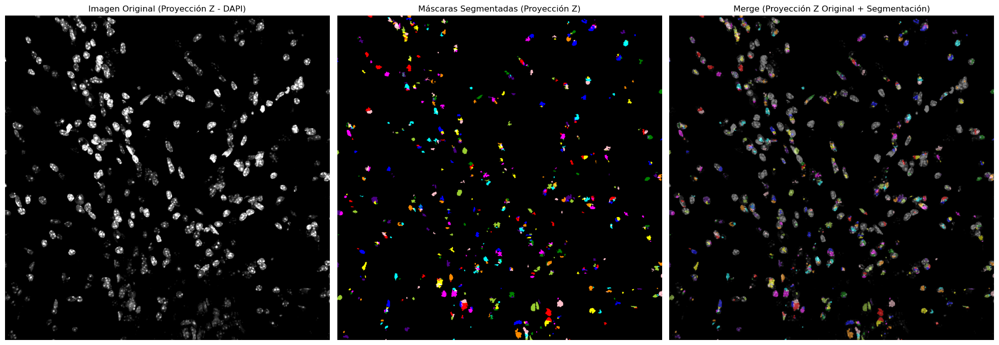

   label  area  centroid-0  centroid-1  centroid-2  volume_um3
0      1    40    1.700000   37.475000  801.450000    3.516490
1      2    39    0.205128  374.487179  388.256410    3.428578
2      3    28    0.428571  633.607143  541.821429    2.461543
3      4    83    2.867470  721.313253  608.975904    7.296717
4      5   478    5.811715  716.506276  612.742678   42.022056


In [4]:
from cellpose import models
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import regionprops_table
from skimage.color import label2rgb
import pandas as pd

# Tamaño del píxel (en µm)
pixel_size = 0.2965  # µm/píxel en X/Y
z_spacing = 1.0  # µm/píxel en Z

# Diámetro ajustado a 3D
diameter_um = 8  # Diámetro en µm
diameter_pixels_xy = diameter_um / pixel_size
diameter_pixels_z = diameter_um / z_spacing
print(f"Diámetro estimado en píxeles (XY): {diameter_pixels_xy:.2f}")
print(f"Diámetro estimado en píxeles (Z): {diameter_pixels_z:.2f}")

# Cargar el stack Z del canal DAPI
dapi_stack = data_8bit[0]  # Canal DAPI completo en Z
print(f"Shape de la imagen 3D (Z, Y, X): {dapi_stack.shape}")

# Crear el modelo de Cellpose para 3D
model = models.Cellpose(model_type="nuclei")

# Aplicar la segmentación en 3D
masks, flows, styles, diams = model.eval(
    dapi_stack,
    diameter=diameter_pixels_xy,  # Diámetro ajustado en XY
    channels=[0, 0],
    #flow_threshold=0.9,  # Monocromático, sin segundo canal
    do_3D=True  # Activar segmentación en 3D
)

# Calcular estadísticas de los núcleos segmentados
voxel_volume = pixel_size**2 * z_spacing  # Volumen de un voxel en µm³
properties = regionprops_table(
    masks, properties=["label", "area", "centroid"]
)
stats = pd.DataFrame(properties)

# Convertir el área (volumen) a unidades reales (µm³)
stats["volume_um3"] = stats["area"] * voxel_volume

# Estadísticas básicas
num_nuclei = len(stats)
mean_volume = stats["volume_um3"].mean()
std_volume = stats["volume_um3"].std()

print(f"Número total de núcleos detectados: {num_nuclei}")
print(f"Volumen promedio de los núcleos: {mean_volume:.2f} µm³")
print(f"Desviación estándar del volumen: {std_volume:.2f} µm³")

# Generar una proyección Z para visualización
labeled_image_2d = np.max(label2rgb(masks, bg_label=0, image_alpha=0), axis=0)  # Proyección Z de las etiquetas

# Visualización
fig, axes = plt.subplots(1, 3, figsize=(20, 10))

# Imagen original (proyección Z)
axes[0].imshow(np.max(dapi_stack, axis=0), cmap="gray")
axes[0].set_title("Imagen Original (Proyección Z - DAPI)")
axes[0].axis("off")

# Máscaras segmentadas (etiquetadas, proyección Z)
axes[1].imshow(labeled_image_2d)
axes[1].set_title("Máscaras Segmentadas (Proyección Z)")
axes[1].axis("off")

# Merge (Proyección Z original + segmentación etiquetada)
axes[2].imshow(np.max(dapi_stack, axis=0), cmap="gray")
axes[2].imshow(labeled_image_2d, alpha=0.5)
axes[2].set_title("Merge (Proyección Z Original + Segmentación)")
axes[2].axis("off")

plt.tight_layout()
plt.show()

# Mostrar el DataFrame con las estadísticas
print(stats.head())

In [5]:
import napari
import numpy as np

# Calcular proyecciones Z (máxima intensidad)
dapi_projection = np.max(dapi_stack, axis=0)  # Proyección Z de DAPI
masks_projection = np.max(masks, axis=0)  # Proyección Z de las máscaras

# Crear un visor de Napari
viewer = napari.Viewer()

# Agregar el stack 3D original del canal DAPI
viewer.add_image(
    dapi_stack,
    name="DAPI Z-Stack (Original)",
    colormap="gray",
    scale=(z_spacing, pixel_size, pixel_size)  # Escala en (Z, Y, X)
)

# Agregar la proyección Z de DAPI
viewer.add_image(
    dapi_projection,
    name="DAPI Proyección Z",
    colormap="gray"
)

# Agregar las máscaras segmentadas como etiquetas 3D
viewer.add_labels(
    masks,
    name="Núcleos Segmentados (3D)",
    scale=(z_spacing, pixel_size, pixel_size)  # Escala en (Z, Y, X)
)

# Agregar la proyección Z de la segmentación
viewer.add_labels(
    masks_projection,
    name="Segmentación Proyección Z"
)

# Extraer centroides como un array 3D para visualización
centroids = np.array([
    stats["centroid-0"],  # Coordenadas Z
    stats["centroid-1"],  # Coordenadas Y
    stats["centroid-2"],  # Coordenadas X
]).T  # Transponer para formato (N, 3)

# Agregar los centroides como puntos en Napari
viewer.add_points(
    centroids,
    name="Centroides de Núcleos",
    size=5,
    face_color="red",
    scale=(z_spacing, pixel_size, pixel_size)  # Escala en (Z, Y, X)
)

# Ejecutar Napari
napari.run()

Assistant skips harvesting pyclesperanto as it's not installed.


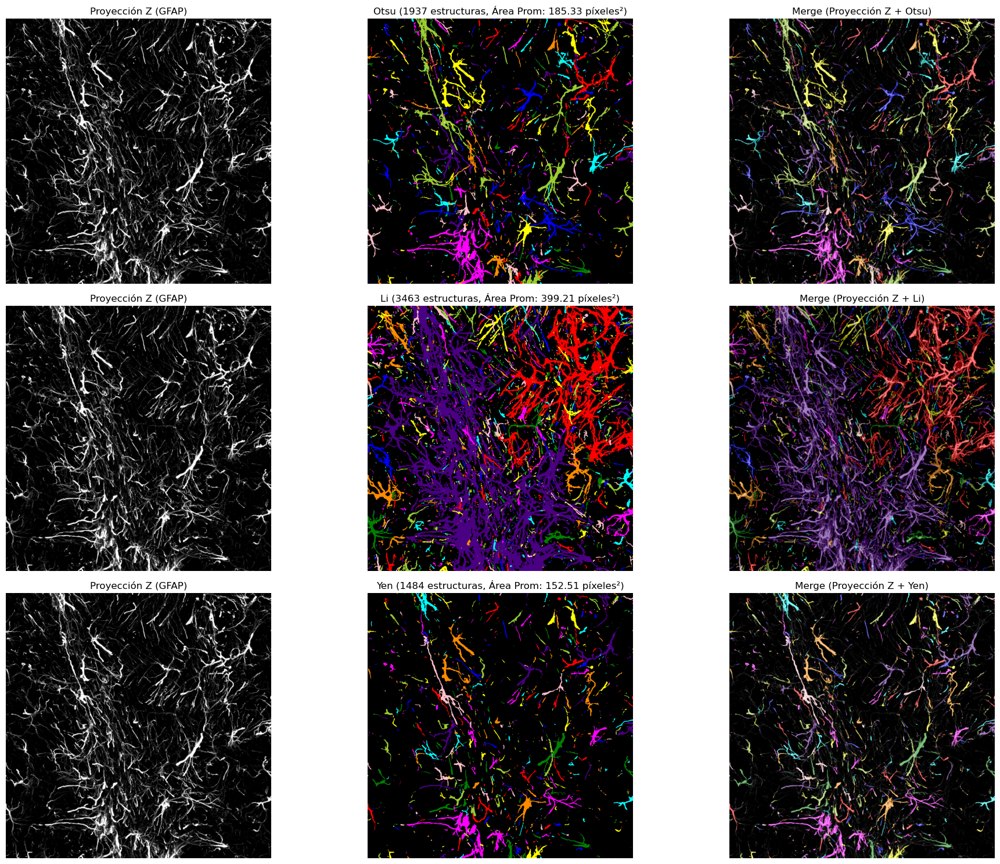

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu, threshold_li, threshold_yen, gaussian
from skimage.measure import label
from skimage.color import label2rgb
from scipy.ndimage import binary_fill_holes

# Cargar el stack Z del canal GFAP
gfap_stack = data_8bit[1]  # Canal GFAP completo en Z

# Filtro Gaussiano para suavizar cada capa del stack Z
gfap_filtered_stack = np.array([gaussian(slice_, sigma=1) for slice_ in gfap_stack])

# Métodos de threshold
threshold_methods = {
    "Otsu": threshold_otsu,
    "Li": threshold_li,
    "Yen": threshold_yen
}

segmentations = {}

for method_name, method_func in threshold_methods.items():
    # Aplicar thresholding en cada capa Z
    binary_stack = []
    for z in range(gfap_filtered_stack.shape[0]):
        threshold_value = method_func(gfap_filtered_stack[z])
        binary_mask = gfap_filtered_stack[z] > threshold_value
        binary_filled = binary_fill_holes(binary_mask)  # Rellenar huecos
        binary_stack.append(binary_filled)

    # Crear una segmentación 3D etiquetada
    binary_stack = np.array(binary_stack)
    labeled_stack = label(binary_stack)
    segmentations[method_name] = labeled_stack

# Visualización de las segmentaciones en el stack Z
fig, axes = plt.subplots(len(segmentations), 3, figsize=(20, 15))

for i, (method_name, labeled_stack) in enumerate(segmentations.items()):
    # Proyección máxima de la segmentación en el stack Z
    labeled_colored = label2rgb(np.max(labeled_stack, axis=0), bg_label=0)

    # Calcular estadísticas
    num_structures = np.max(labeled_stack)
    mean_area = np.sum(labeled_stack > 0) / num_structures if num_structures > 0 else 0

    # Proyección máxima del stack Z original
    max_projection_original = np.max(gfap_stack, axis=0)

    # Imagen original (proyección Z)
    axes[i, 0].imshow(max_projection_original, cmap="gray")
    axes[i, 0].set_title("Proyección Z (GFAP)")
    axes[i, 0].axis("off")

    # Segmentación (proyección máxima)
    axes[i, 1].imshow(labeled_colored)
    axes[i, 1].set_title(f"{method_name} ({num_structures} estructuras, Área Prom: {mean_area:.2f} píxeles²)")
    axes[i, 1].axis("off")

    # Merge de la segmentación con la imagen original
    axes[i, 2].imshow(max_projection_original, cmap="gray")
    axes[i, 2].imshow(labeled_colored, alpha=0.5)
    axes[i, 2].set_title(f"Merge (Proyección Z + {method_name})")
    axes[i, 2].axis("off")

plt.tight_layout()
plt.show()

In [7]:
import napari
import numpy as np

# Crear un visor de Napari
viewer = napari.Viewer()

# Agregar el stack Z original (GFAP)
viewer.add_image(
    gfap_stack,
    name="GFAP Z-Stack (Original)",
    colormap="gray",
    scale=(1.0, pixel_size, pixel_size)  # Escala en (Z, Y, X)
)

# Agregar las segmentaciones generadas por cada método
for method_name, labeled_stack in segmentations.items():
    # Agregar la segmentación 3D
    viewer.add_labels(
        labeled_stack,
        name=f"Segmentación 3D ({method_name})",
        scale=(1.0, pixel_size, pixel_size)
    )

    # Generar la proyección máxima del stack segmentado
    projection = np.max(labeled_stack, axis=0)
    viewer.add_labels(
        projection,
        name=f"Proyección Z (Segmentación - {method_name})",
        scale=(pixel_size, pixel_size)  # Escala en (Y, X) para proyección Z
    )

# Ejecutar Napari
napari.run()


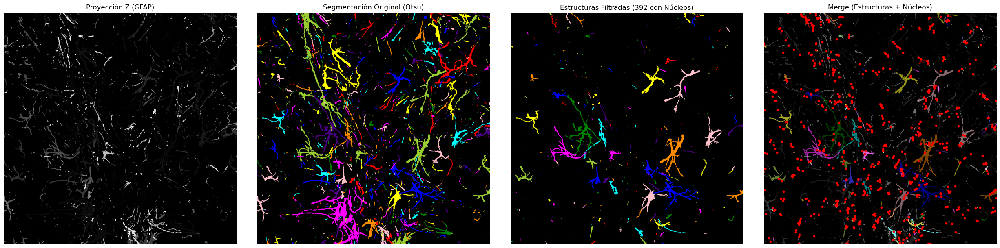

Número total de estructuras detectadas con Otsu: 1937
Número de estructuras con núcleos: 392


In [8]:
from skimage.measure import regionprops_table
import pandas as pd
import numpy as np
from scipy.spatial import cKDTree
from skimage.color import label2rgb
import matplotlib.pyplot as plt

# Método de segmentación GFAP que queremos usar (puedes cambiarlo a "Li" o "Yen")
method_to_filter = "Otsu"
gfap_labels = segmentations[method_to_filter]  # Segmentación de GFAP en 3D
nucleus_labels = masks  # Segmentación de núcleos DAPI en 3D

# Obtener centroides de estructuras GFAP en 3D
gfap_props = regionprops_table(gfap_labels, properties=["label", "centroid"])
gfap_df = pd.DataFrame(gfap_props)
gfap_centroids = gfap_df[["centroid-0", "centroid-1", "centroid-2"]].to_numpy()  # (Z, Y, X)

# Obtener centroides de los núcleos en 3D
nucleus_props = regionprops_table(nucleus_labels, properties=["label", "centroid"])
nucleus_df = pd.DataFrame(nucleus_props)
nucleus_centroids = nucleus_df[["centroid-0", "centroid-1", "centroid-2"]].to_numpy()  # (Z, Y, X)

# Construir un KDTree en 3D con las estructuras GFAP
gfap_tree = cKDTree(gfap_centroids)
distances, gfap_indices = gfap_tree.query(nucleus_centroids)  # Buscar el GFAP más cercano a cada núcleo

# Filtrar las estructuras GFAP que tienen al menos un núcleo
gfap_with_nuclei = gfap_df.iloc[gfap_indices].label.unique()
filtered_gfap_labels = np.isin(gfap_labels, gfap_with_nuclei) * gfap_labels  # Mantener solo estructuras con núcleos

# Visualización 2D en proyección Z
gfap_projection = np.max(gfap_labels, axis=0)  # Proyección Z de GFAP
filtered_colored = label2rgb(np.max(filtered_gfap_labels, axis=0), bg_label=0)

# Gráficos
fig, axes = plt.subplots(1, 4, figsize=(25, 6))

# Imagen original GFAP (proyección Z)
axes[0].imshow(gfap_projection, cmap="gray")
axes[0].set_title("Proyección Z (GFAP)")
axes[0].axis("off")

# Segmentación original (proyección Z)
axes[1].imshow(label2rgb(np.max(gfap_labels, axis=0), bg_label=0))
axes[1].set_title(f"Segmentación Original ({method_to_filter})")
axes[1].axis("off")

# Segmentación filtrada (solo estructuras con núcleo)
axes[2].imshow(filtered_colored)
axes[2].set_title(f"Estructuras Filtradas ({len(gfap_with_nuclei)} con Núcleos)")
axes[2].axis("off")

# Merge de GFAP + Núcleos
axes[3].imshow(gfap_projection, cmap="gray")
axes[3].imshow(filtered_colored, alpha=0.5)
axes[3].scatter(
    nucleus_centroids[:, 2],  # X
    nucleus_centroids[:, 1],  # Y
    c="red", label="Núcleos", s=10
)
axes[3].set_title("Merge (Estructuras + Núcleos)")
axes[3].axis("off")

plt.tight_layout()
plt.show()

# Métricas finales
print(f"Número total de estructuras detectadas con {method_to_filter}: {np.max(gfap_labels)}")
print(f"Número de estructuras con núcleos: {len(gfap_with_nuclei)}")

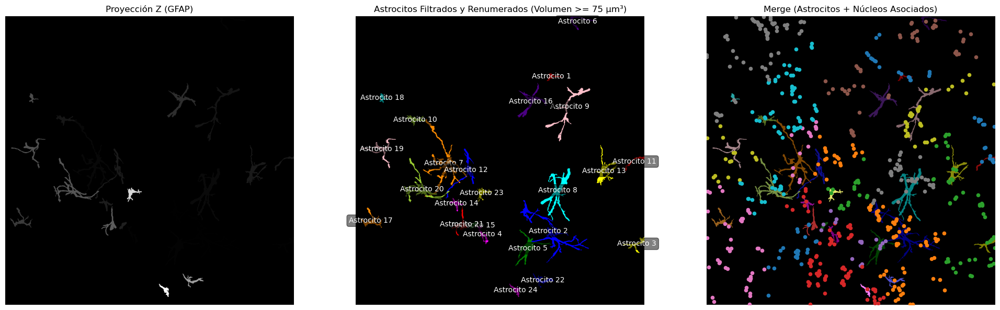

Número total de astrocitos únicos detectados (Volumen >= 75 µm³): 24
Número de núcleos realmente asociados a astrocitos: 623


In [9]:
from skimage.measure import regionprops, label
import numpy as np
import matplotlib.pyplot as plt
from skimage.color import label2rgb
from scipy.spatial import cKDTree

# Parámetros
volume_threshold = 50  # Umbral de volumen mínimo en µm³ para filtrar astrocitos

# Calcular volumen de cada estructura en la segmentación filtrada
astrocyte_props = regionprops(filtered_gfap_labels)
astrocyte_volumes = [prop.area * (pixel_size ** 2) * z_spacing for prop in astrocyte_props]  # Convertir volumen a µm³

# Crear un nuevo label eliminando estructuras con volumen < volume_threshold
filtered_astrocyte_labels = np.zeros_like(filtered_gfap_labels)
for idx, prop in enumerate(astrocyte_props):
    if astrocyte_volumes[idx] >= volume_threshold:
        filtered_astrocyte_labels[tuple(prop.coords.T)] = prop.label

# Renumerar etiquetas consecutivas
filtered_astrocyte_labels_relabel = label(filtered_astrocyte_labels)

# Obtener centroides en 3D de los astrocitos renumerados
new_astrocyte_props = regionprops(filtered_astrocyte_labels_relabel)
new_centroids = {prop.label: prop.centroid for prop in new_astrocyte_props}

# Construir KDTree en 3D para asociar núcleos con astrocitos
gfap_tree = cKDTree(list(new_centroids.values()))
distances, gfap_indices = gfap_tree.query(nucleus_centroids)

# Crear un diccionario para agrupar núcleos por astrocito
astrocyte_nuclei = {label_id: [] for label_id in new_centroids.keys()}

# Asociar cada núcleo a su astrocito correspondiente
for i, idx in enumerate(gfap_indices):
    astrocyte_label = idx + 1  # Ajuste de índice
    if astrocyte_label in astrocyte_nuclei:  # Verificar si el astrocito está en la lista de filtrados
        astrocyte_nuclei[astrocyte_label].append(nucleus_centroids[i])

# Visualización con etiquetas corregidas
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Imagen original de GFAP (proyección Z)
axes[0].imshow(np.max(filtered_astrocyte_labels, axis=0), cmap="gray")
axes[0].set_title("Proyección Z (GFAP)")
axes[0].axis("off")

# Máscaras de astrocitos filtrados y renumerados
labeled_filtered = label2rgb(np.max(filtered_astrocyte_labels_relabel, axis=0), bg_label=0)
axes[1].imshow(labeled_filtered)
axes[1].set_title(f"Astrocitos Filtrados y Renumerados (Volumen >= {volume_threshold} µm³)")

# Agregar etiquetas de astrocitos en la imagen renumerada
for label_id, (centroid_z, centroid_y, centroid_x) in new_centroids.items():
    axes[1].text(
        int(centroid_x), int(centroid_y),  # Asegurar (X, Y)
        f"Astrocito {label_id}",
        color="white",
        fontsize=10,
        ha="center", va="center",
        bbox=dict(boxstyle="round", facecolor="black", alpha=0.5)
    )
axes[1].axis("off")

# Merge con **solo los núcleos que están en cada astrocito**
axes[2].imshow(np.max(filtered_astrocyte_labels, axis=0), cmap="gray")
axes[2].imshow(labeled_filtered, alpha=0.5)

# Dibujar los núcleos con el mismo color que su astrocito
for label_id, nuclei in astrocyte_nuclei.items():
    nuclei = np.array(nuclei)  # Convertir a numpy array
    if len(nuclei) > 0:
        axes[2].scatter(
            nuclei[:, 2],  # X
            nuclei[:, 1],  # Y
            label=f"Astrocito {label_id}",
            s=20
        )

axes[2].set_title(f"Merge (Astrocitos + Núcleos Asociados)")
axes[2].axis("off")

plt.tight_layout()
plt.show()

# Número total de astrocitos restantes
num_filtered_astrocytes = len(new_centroids)
num_filtered_nuclei = sum(len(n) for n in astrocyte_nuclei.values())

print(f"Número total de astrocitos únicos detectados (Volumen >= {volume_threshold} µm³): {num_filtered_astrocytes}")
print(f"Número de núcleos realmente asociados a astrocitos: {num_filtered_nuclei}")

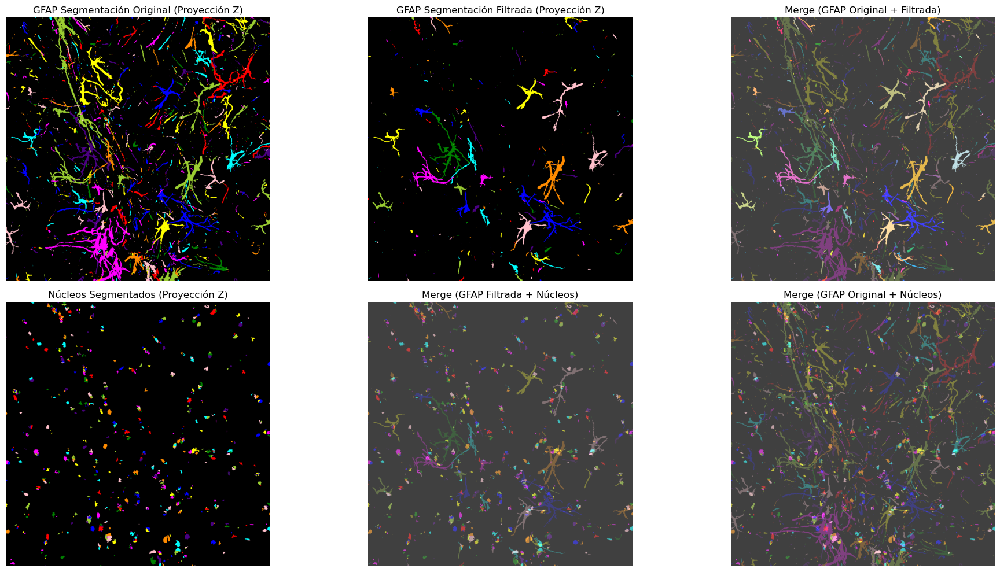

In [10]:
import matplotlib.pyplot as plt
from skimage.color import label2rgb

# Proyección Z de las etiquetas GFAP (original y filtrada)
gfap_projection_original = np.max(gfap_labels, axis=0)
gfap_projection_filtered = np.max(filtered_gfap_labels, axis=0)

# Proyección Z de las etiquetas de núcleos
nuclei_projection = np.max(masks, axis=0)

# Generar imágenes coloreadas para etiquetas
gfap_colored_original = label2rgb(gfap_projection_original, bg_label=0)
gfap_colored_filtered = label2rgb(gfap_projection_filtered, bg_label=0)
nuclei_colored = label2rgb(nuclei_projection, bg_label=0)

# Visualización de las proyecciones Z
fig, axes = plt.subplots(2, 3, figsize=(20, 10))

# GFAP original
axes[0, 0].imshow(gfap_colored_original)
axes[0, 0].set_title("GFAP Segmentación Original (Proyección Z)")
axes[0, 0].axis("off")

# GFAP filtrada
axes[0, 1].imshow(gfap_colored_filtered)
axes[0, 1].set_title("GFAP Segmentación Filtrada (Proyección Z)")
axes[0, 1].axis("off")

# Merge GFAP filtrada + original
axes[0, 2].imshow(gfap_colored_original, alpha=0.5)
axes[0, 2].imshow(gfap_colored_filtered, alpha=0.5)
axes[0, 2].set_title("Merge (GFAP Original + Filtrada)")
axes[0, 2].axis("off")

# Núcleos
axes[1, 0].imshow(nuclei_colored)
axes[1, 0].set_title("Núcleos Segmentados (Proyección Z)")
axes[1, 0].axis("off")

# Merge GFAP filtrada + Núcleos
axes[1, 1].imshow(gfap_colored_filtered, alpha=0.5)
axes[1, 1].imshow(nuclei_colored, alpha=0.5)
axes[1, 1].set_title("Merge (GFAP Filtrada + Núcleos)")
axes[1, 1].axis("off")

# Merge GFAP original + Núcleos
axes[1, 2].imshow(gfap_colored_original, alpha=0.5)
axes[1, 2].imshow(nuclei_colored, alpha=0.5)
axes[1, 2].set_title("Merge (GFAP Original + Núcleos)")
axes[1, 2].axis("off")

plt.tight_layout()
plt.show()

In [11]:
import napari
import numpy as np

# Crear un visor de Napari
viewer = napari.Viewer()

# Agregar el Z-stack de GFAP segmentado (3D completo)
viewer.add_labels(
    gfap_labels,
    name="GFAP Segmentación Original (3D)",
    scale=(z_spacing, pixel_size, pixel_size),  # Establecer escala en (Z, Y, X)
)

# Agregar el Z-stack de GFAP filtrado (3D completo)
viewer.add_labels(
    filtered_gfap_labels,
    name="GFAP Segmentación Filtrada (3D)",
    scale=(z_spacing, pixel_size, pixel_size),  # Escala en (Z, Y, X)
)

# Agregar el Z-stack de núcleos segmentados (3D completo)
viewer.add_labels(
    masks,
    name="Núcleos Segmentados (3D)",
    scale=(z_spacing, pixel_size, pixel_size),  # Escala en (Z, Y, X)
)

# Agregar las proyecciones Z de las etiquetas
viewer.add_image(
    np.max(gfap_labels, axis=0),
    name="Proyección Z - GFAP Original",
    colormap="viridis",
    scale=(pixel_size, pixel_size),
)

viewer.add_image(
    np.max(filtered_gfap_labels, axis=0),
    name="Proyección Z - GFAP Filtrado",
    colormap="viridis",
    scale=(pixel_size, pixel_size),
)

viewer.add_image(
    np.max(masks, axis=0),
    name="Proyección Z - Núcleos",
    colormap="magenta",
    scale=(pixel_size, pixel_size),
)

# Ejecutar Napari
napari.run()

In [12]:
from skimage.measure import regionprops_table
import pandas as pd

# Proyección Z de los astrocitos segmentados (máximo en Z)
astrocyte_projection = np.max(filtered_astrocyte_labels_relabel, axis=0)

# Calcular propiedades en la proyección Z
astrocyte_props = regionprops_table(
    astrocyte_projection,  
    intensity_image=np.max(gfap_labels, axis=0),  # Proyección Z del canal GFAP
    properties=[
        "label",          # Identificador del astrocito
        "area",           # Área en píxeles (2D)
        "perimeter",      # Perímetro en píxeles (2D)
        "convex_area",    # Área convexa (2D)
        "solidity",       # Compacidad (area / convex_area)
        "mean_intensity",  # Intensidad media en GFAP
        "max_intensity",   # Intensidad máxima en GFAP
        "min_intensity",   # Intensidad mínima en GFAP
        "centroid",       # Coordenadas del centroide en 2D
    ]
)

# Convertir los resultados a un DataFrame
astrocyte_metrics = pd.DataFrame(astrocyte_props)

# Convertir área y perímetro a unidades reales (µm² y µm)
astrocyte_metrics["area_um2"] = astrocyte_metrics["area"] * (pixel_size ** 2)
astrocyte_metrics["perimeter_um"] = astrocyte_metrics["perimeter"] * pixel_size

# Mostrar resumen de los datos
print("Resumen de Métricas de Astrocitos (Proyección Z):")
print(astrocyte_metrics.describe())

# Mostrar algunas filas del DataFrame
print(f"Número total de astrocitos en proyección Z: {len(astrocyte_metrics)}")
astrocyte_metrics.head()

Resumen de Métricas de Astrocitos (Proyección Z):
           label         area    perimeter   convex_area   solidity  \
count  24.000000    24.000000    24.000000     24.000000  24.000000   
mean   12.500000  1563.791667   589.636622   6763.166667   0.349166   
std     7.071068  1369.583592   523.851002   7767.930045   0.160720   
min     1.000000   316.000000    91.704581    399.000000   0.168930   
25%     6.750000   592.500000   240.937338   1335.000000   0.222903   
50%    12.500000   930.500000   354.027958   2751.500000   0.321060   
75%    18.250000  2137.500000   739.624458   9030.250000   0.453602   
max    24.000000  4969.000000  2063.263202  27636.000000   0.791980   

       mean_intensity  max_intensity  min_intensity  centroid-0  centroid-1  \
count       24.000000      24.000000      24.000000   24.000000   24.000000   
mean       375.996461    1168.083333     363.375000  580.653612  516.831811   
std        463.531282     696.282733     461.849949  236.684522  274.1627

,label,area,perimeter,convex_area,solidity,mean_intensity,max_intensity,min_intensity,centroid-0,centroid-1,area_um2,perimeter_um
0,1,386,155.568542,808,0.477723,44.756477,1876.0,6.0,214.251295,696.455959,33.934128,46.126073
1,2,4969,2063.263202,27636,0.179802,18.852083,1834.0,12.0,766.025760,691.574160,436.835970,611.757539
2,3,826,304.835570,2442,0.338247,27.012107,1468.0,20.0,809.110169,994.485472,72.615518,90.383746
3,4,624,252.551299,1218,0.512315,23.144231,224.0,21.0,774.849359,451.259615,54.857244,74.881460
4,5,2289,713.553391,8931,0.256298,40.618174,1318.0,23.0,821.756662,611.140236,201.231140,211.568580


C:\Users\Esteban Diaz\anaconda3\envs\bioimaging\lib\site-packages\skimage\util\dtype.py:541: UserWarning: Downcasting int64 to uint8 without scaling because max value 24 fits in uint8
  return _convert(image, np.uint8, force_copy)


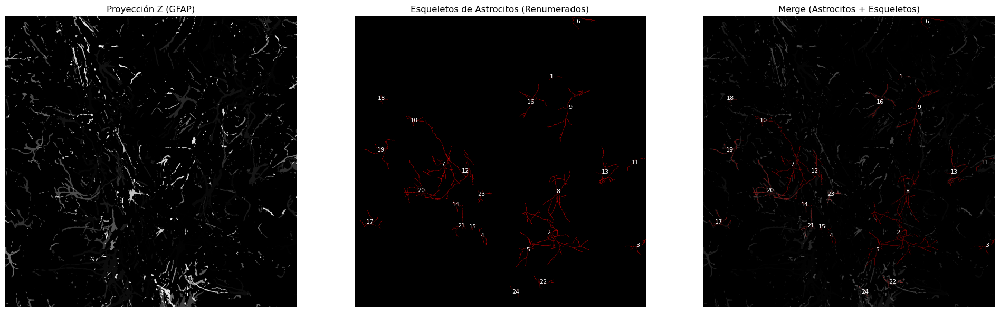

Número total de astrocitos analizados: 24
   label  skeleton_length_um
0      1           75.904809
1      2         1200.380339
2      3          159.400099
3      4          146.387846
4      5          410.970324


In [13]:
from skimage.morphology import skeletonize_3d
from skimage.measure import regionprops
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from skimage.color import label2rgb

# Esqueletización en 3D
skeletonized_astrocytes_3D = skeletonize_3d(filtered_astrocyte_labels_relabel)

# Calcular propiedades morfológicas del esqueleto en 3D
astrocyte_skeleton_metrics = []
centroid_coords = {}

# Recorrer cada astrocito en 3D
for prop in regionprops(filtered_astrocyte_labels_relabel):
    label_id = prop.label
    single_astrocyte_mask = filtered_astrocyte_labels_relabel == label_id  # Máscara individual en 3D

    # Extraer el esqueleto del astrocito actual
    single_skeleton = skeletonized_astrocytes_3D * single_astrocyte_mask

    # Calcular longitud del esqueleto en 3D
    skeleton_length_voxels = np.sum(single_skeleton > 0)
    skeleton_length_um = skeleton_length_voxels * np.sqrt(pixel_size**2 + pixel_size**2 + z_spacing**2)

    # Guardar métricas
    astrocyte_skeleton_metrics.append({
        "label": label_id,
        "skeleton_length_um": skeleton_length_um,
    })

    # Guardar centroides para la visualización
    centroid_coords[label_id] = prop.centroid  # (Z, Y, X)

# Convertir a DataFrame
skeleton_metrics_df = pd.DataFrame(astrocyte_skeleton_metrics)

# Visualización de la proyección Z
astrocyte_projection = np.max(filtered_astrocyte_labels_relabel, axis=0)  # Proyección en Z
skeleton_projection = np.max(skeletonized_astrocytes_3D, axis=0)  # Esqueletos en 2D para visualización

# Graficar
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Imagen original GFAP
axes[0].imshow(np.max(gfap_labels, axis=0), cmap="gray")  # Proyección Z
axes[0].set_title("Proyección Z (GFAP)")
axes[0].axis("off")

# Máscaras de astrocitos esqueletizados
labeled_skeleton = label2rgb(skeleton_projection, bg_label=0)
axes[1].imshow(labeled_skeleton)
axes[1].set_title("Esqueletos de Astrocitos (Renumerados)")

# Agregar etiquetas de los astrocitos
for label_id, (centroid_z, centroid_y, centroid_x) in centroid_coords.items():
    axes[1].text(
        int(centroid_x),
        int(centroid_y),
        f"{label_id}",
        color="white",
        fontsize=8,
        ha="center",
        va="center",
        bbox=dict(boxstyle="round", facecolor="black", alpha=0.5),
    )
axes[1].axis("off")

# Merge (Astrocitos + Esqueletos)
axes[2].imshow(np.max(gfap_labels, axis=0), cmap="gray")
axes[2].imshow(labeled_skeleton, alpha=0.7)
axes[2].set_title("Merge (Astrocitos + Esqueletos)")

# Agregar etiquetas en el merge
for label_id, (centroid_z, centroid_y, centroid_x) in centroid_coords.items():
    axes[2].text(
        int(centroid_x),
        int(centroid_y),
        f"{label_id}",
        color="white",
        fontsize=8,
        ha="center",
        va="center",
        bbox=dict(boxstyle="round", facecolor="black", alpha=0.5),
    )
axes[2].axis("off")

plt.tight_layout()
plt.show()

# Mostrar métricas
print(f"Número total de astrocitos analizados: {len(skeleton_metrics_df)}")
print(skeleton_metrics_df.head())

In [14]:
import napari
import numpy as np

# Crear el visor de Napari
viewer = napari.Viewer()

# Agregar el stack 3D del canal GFAP
viewer.add_image(
    gfap_labels, 
    name="GFAP (Z-Stack)", 
    colormap="gray",
    scale=(z_spacing, pixel_size, pixel_size)  # Ajuste de escala en (Z, Y, X)
)

# Agregar la segmentación 3D de astrocitos
viewer.add_labels(
    filtered_astrocyte_labels_relabel,
    name="Astrocitos Filtrados (3D)",
    scale=(z_spacing, pixel_size, pixel_size)
)

# Agregar el esqueleto 3D
viewer.add_labels(
    skeletonized_astrocytes_3D,
    name="Esqueletos de Astrocitos (3D)",
    scale=(z_spacing, pixel_size, pixel_size)
)

# Agregar la proyección Z del canal GFAP para comparación
gfap_projection = np.max(gfap_labels, axis=0)
viewer.add_image(
    gfap_projection, 
    name="Proyección Z (GFAP)", 
    colormap="gray"
)

# Agregar la proyección Z de la segmentación
astrocyte_projection = np.max(filtered_astrocyte_labels_relabel, axis=0)
viewer.add_labels(
    astrocyte_projection, 
    name="Astrocitos Proyección Z"
)

# Agregar la proyección Z de los esqueletos
skeleton_projection = np.max(skeletonized_astrocytes_3D, axis=0)
viewer.add_labels(
    skeleton_projection, 
    name="Esqueletos Proyección Z"
)

# Agregar los centroides en 3D como puntos rojos
centroid_points_3D = np.array(list(centroid_coords.values()))  # Coordenadas (Z, Y, X)
labels = list(centroid_coords.keys())  # Etiquetas de astrocitos

viewer.add_points(
    centroid_points_3D,
    size=10,
    face_color="red",
    edge_color="black",
    name="Centroides 3D",
    properties={"label": labels},
    text={"text": "label", "size": 12, "color": "yellow", "anchor": "center"},
    scale=(z_spacing, pixel_size, pixel_size)
)

# **Agregar la proyección Z de los centroides**
# Extraer solo las coordenadas (Y, X) ignorando Z
centroid_points_2D = centroid_points_3D[:, 1:]  # Eliminar el eje Z (proyección)

viewer.add_points(
    centroid_points_2D,
    size=10,
    face_color="cyan",
    edge_color="black",
    name="Centroides Proyección Z",
    properties={"label": labels},
    text={"text": "label", "size": 12, "color": "yellow", "anchor": "center"}
)

# Ejecutar Napari
napari.run()

C:\Users\Esteban Diaz\anaconda3\envs\bioimaging\lib\site-packages\napari\utils\migrations.py:101: FutureWarning: Argument 'edge_color' is deprecated, please use 'border_color' instead. The argument 'edge_color' was deprecated in 0.5.0 and it will be removed in 0.6.0.
  return func(*args, **kwargs)
C:\Users\Esteban Diaz\anaconda3\envs\bioimaging\lib\site-packages\napari\utils\migrations.py:101: FutureWarning: Argument 'edge_color' is deprecated, please use 'border_color' instead. The argument 'edge_color' was deprecated in 0.5.0 and it will be removed in 0.6.0.
  return func(*args, **kwargs)


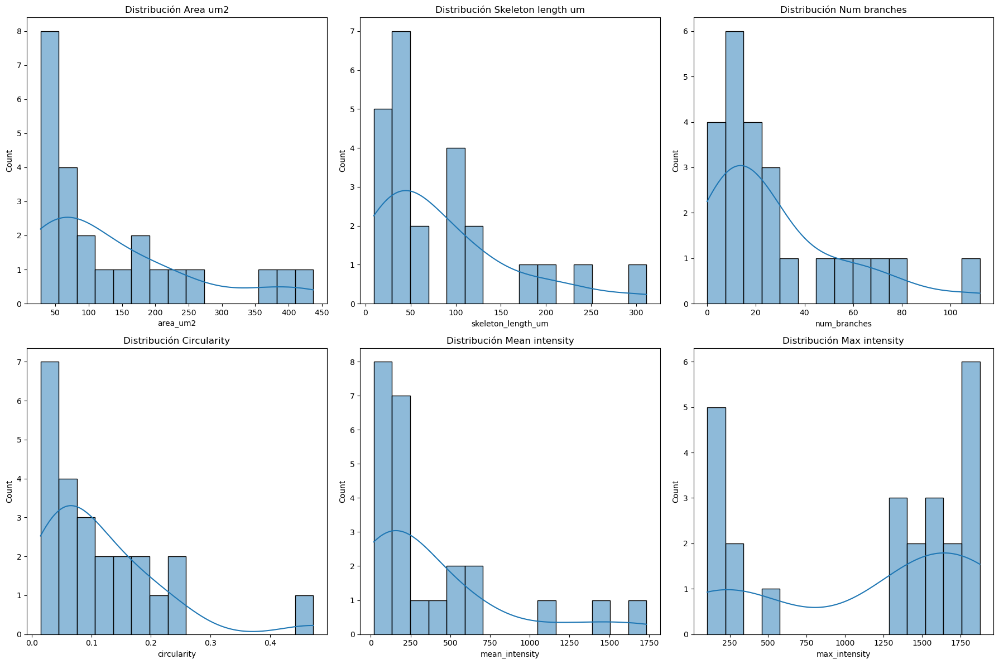


### Métricas en 2D (Proyección Z) ###
   label    area_um2  perimeter_um  circularity  skeleton_length_um  \
0      1   33.934128     46.126073     0.200426             20.7550   
1      2  436.835970    611.757539     0.014668            311.3250   
2      3   72.615518     90.383746     0.111701             42.9925   
3      4   54.857244     74.881460     0.122941             35.2835   
4      5  201.231140    211.568580     0.056494            109.1120   

   skeleton_density  num_endpoints  num_branches  mean_intensity  \
0          0.611626              3             5       44.756477   
1          0.712682             27           112       18.852083   
2          0.592057              7            12       27.012107   
3          0.643188              7            11       23.144231   
4          0.542222             12            36       40.618174   

   max_intensity  
0           1876  
1           1834  
2           1468  
3            224  
4           1318  


In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from skimage.morphology import skeletonize
from skimage.measure import regionprops
from scipy.ndimage import convolve

# ========================== PROYECCIÓN Z ========================== #

# Generar proyección Z de los astrocitos segmentados
astrocyte_projection = np.max(filtered_astrocyte_labels_relabel, axis=0)

# Esqueletización en 2D
skeleton_2D = skeletonize(astrocyte_projection > 0)

# Kernel para contar puntos de ramificación y terminales en 2D
kernel_branch_2D = np.array([[1, 1, 1], 
                             [1, 10, 1], 
                             [1, 1, 1]])

# Inicializar lista de métricas
metrics_2D = []

# ========================== ANÁLISIS MORFOLÓGICO EN 2D ========================== #
for prop in regionprops(astrocyte_projection):
    label_id = prop.label
    mask_2D = astrocyte_projection == label_id  # Máscara individual del astrocito
    skel_2D = skeleton_2D * mask_2D  # Esqueleto del astrocito actual

    # **1. Área y Perímetro**
    area_2D = prop.area * pixel_size**2
    perimeter_2D = prop.perimeter * pixel_size

    # **2. Circularidad (Forma del astrocito)**
    circularity_2D = (4 * np.pi * area_2D) / (perimeter_2D**2) if perimeter_2D > 0 else np.nan

    # **3. Longitud del esqueleto**
    skeleton_length_2D = np.sum(skel_2D) * pixel_size  # Longitud en µm

    # **4. Densidad del esqueleto (longitud / área)**
    skeleton_density_2D = skeleton_length_2D / area_2D if area_2D > 0 else np.nan

    # **5. Número de ramificaciones y terminales**
    conv_2D = convolve(skel_2D.astype(int), kernel_branch_2D, mode="constant", cval=0)
    num_endpoints_2D = np.sum(conv_2D == 11)  # Puntos terminales
    num_branches_2D = np.sum(conv_2D == 13)  # Puntos de ramificación

    # **6. Fluorescencia (GFAP)**
    mean_intensity = np.mean(gfap_projection[mask_2D])  # Intensidad media
    max_intensity = np.max(gfap_projection[mask_2D])    # Intensidad máxima

    # Guardar métricas
    metrics_2D.append({
        "label": label_id,
        "area_um2": area_2D,
        "perimeter_um": perimeter_2D,
        "circularity": circularity_2D,
        "skeleton_length_um": skeleton_length_2D,
        "skeleton_density": skeleton_density_2D,
        "num_endpoints": num_endpoints_2D,
        "num_branches": num_branches_2D,
        "mean_intensity": mean_intensity,
        "max_intensity": max_intensity,
    })

# Crear DataFrame con los resultados
df_2D = pd.DataFrame(metrics_2D)

# ========================== VISUALIZACIÓN ========================== #

# Graficar histogramas de métricas clave
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
features = ["area_um2", "skeleton_length_um", "num_branches", "circularity", "mean_intensity", "max_intensity"]

for i, feature in enumerate(features):
    sns.histplot(df_2D[feature], bins=15, kde=True, ax=axes[i//3, i%3])
    axes[i//3, i%3].set_title(f"Distribución {feature.replace('_', ' ').capitalize()}")

plt.tight_layout()
plt.show()

# Guardar resultados en CSV
df_2D.to_csv("astrocyte_metrics_2D.csv", index=False)

# Mostrar primeras filas del DataFrame
print("\n### Métricas en 2D (Proyección Z) ###")
print(df_2D.head())

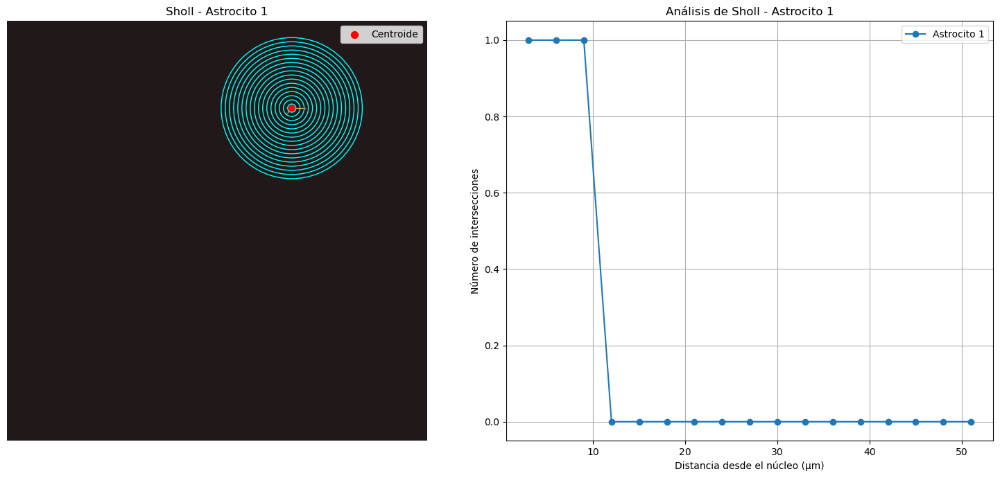

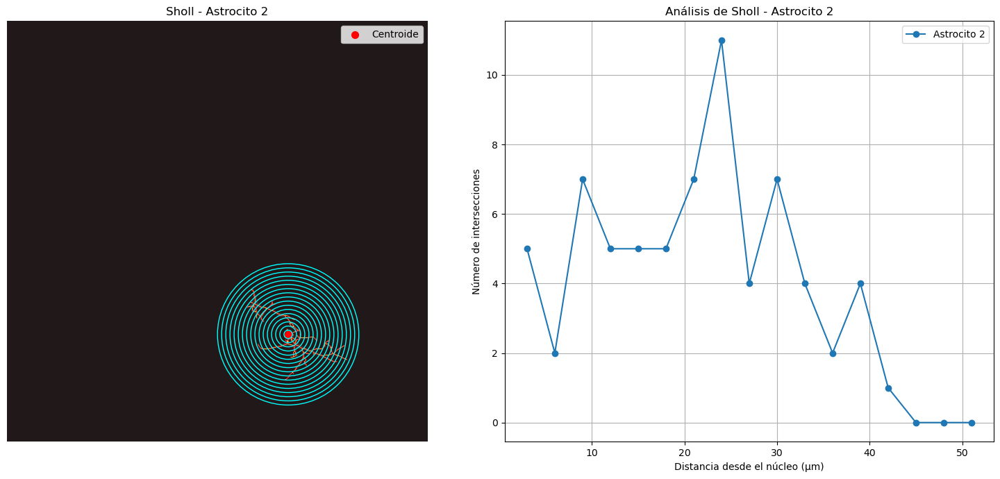

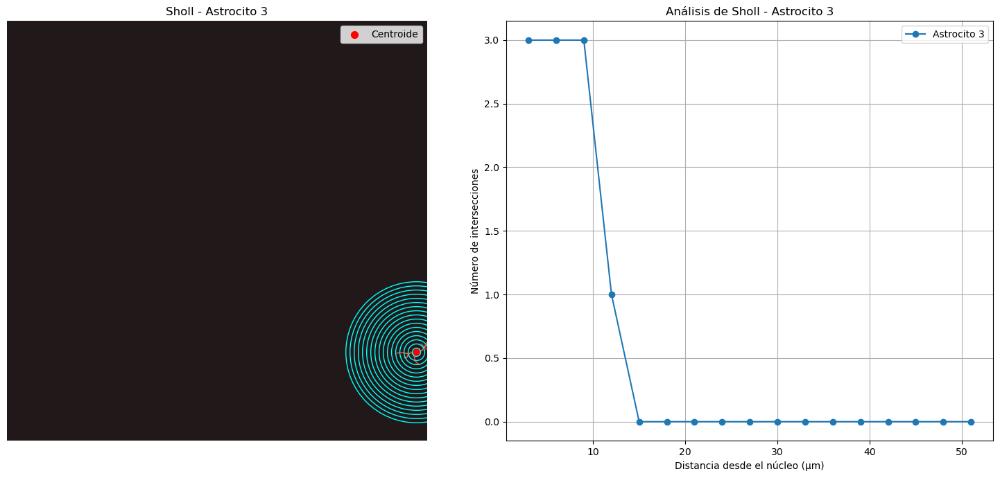

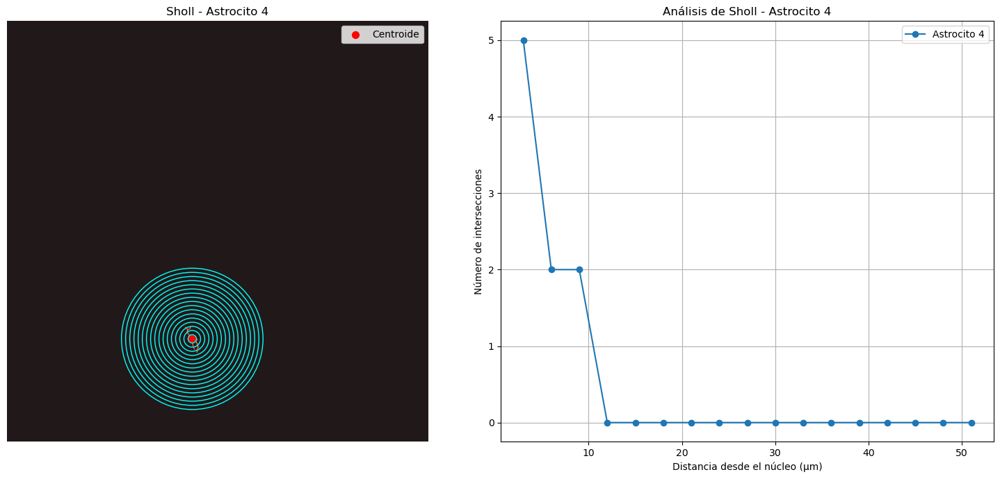

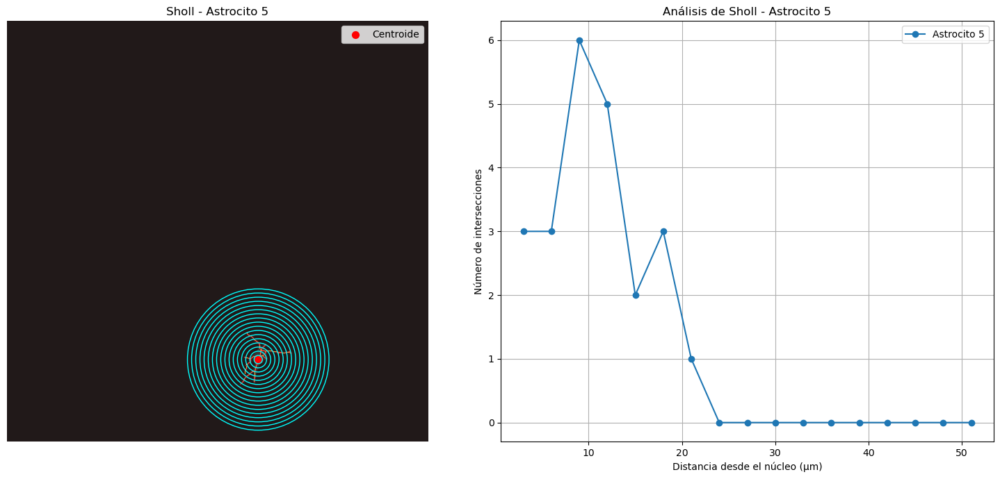

...

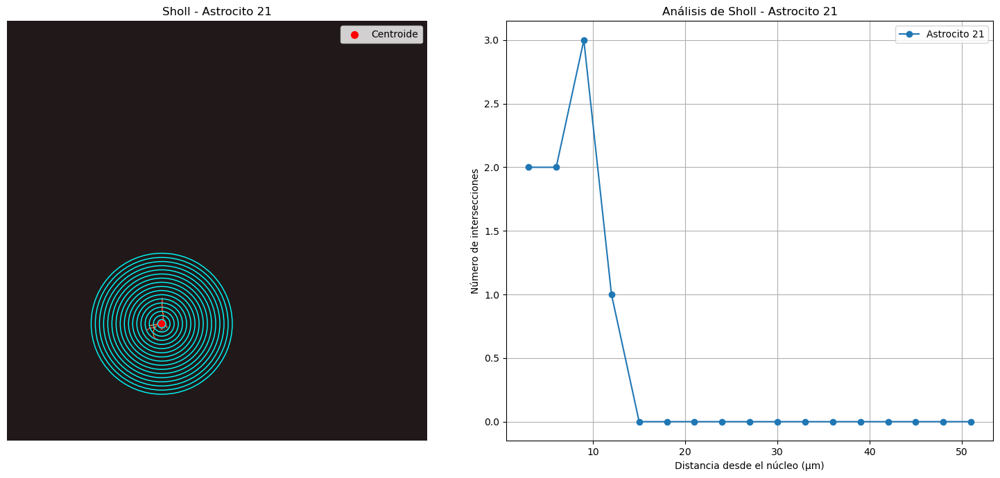

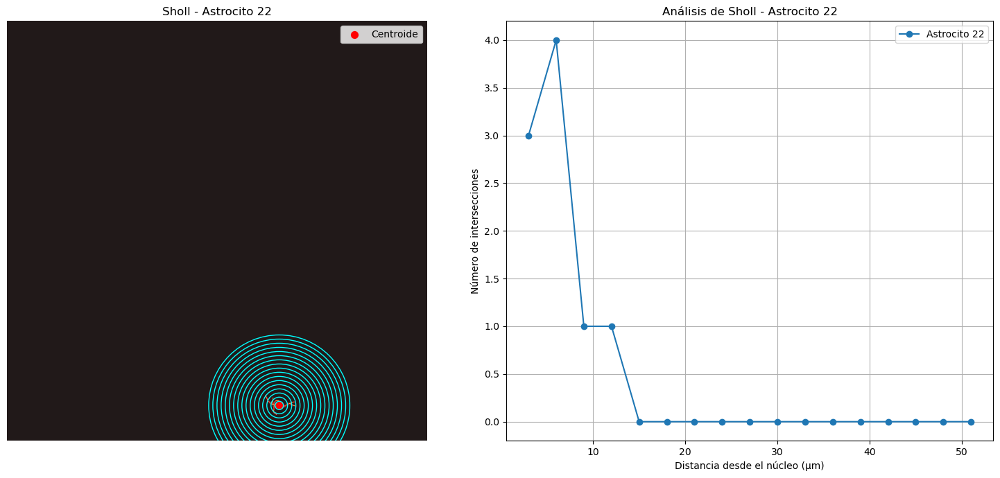

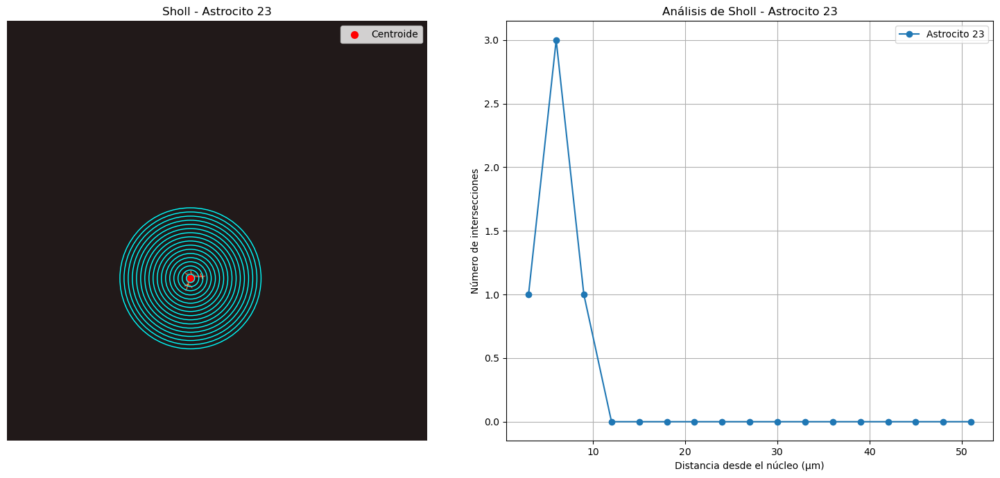

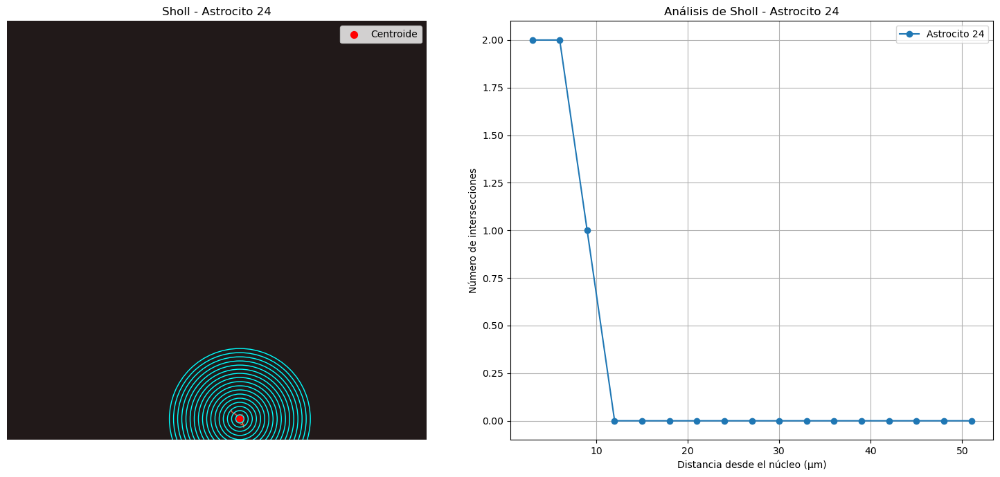

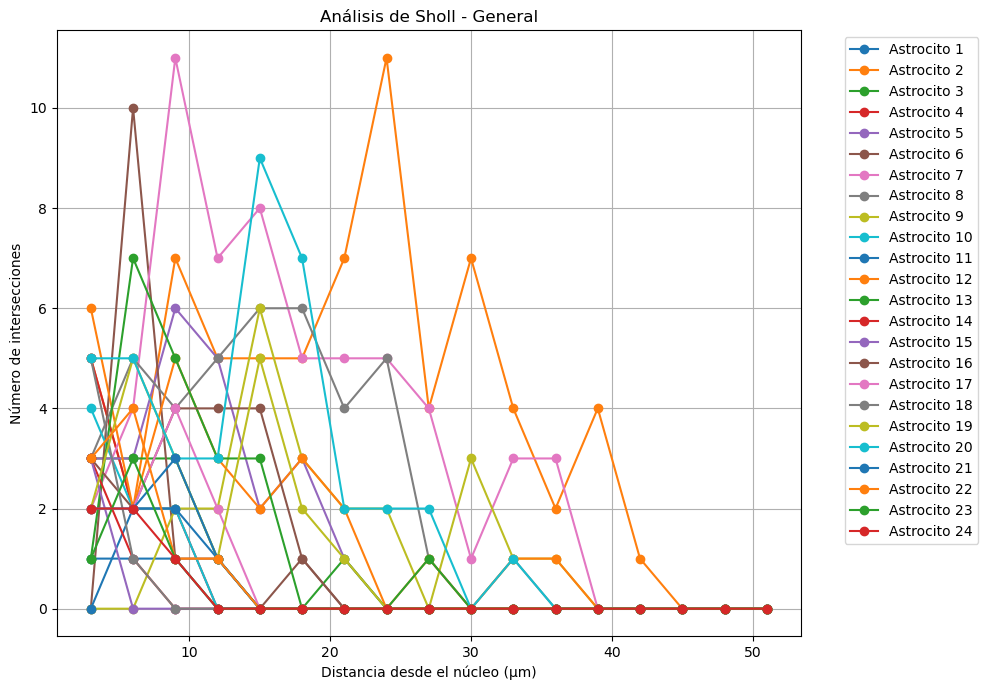


### Resultados del Análisis de Sholl en 2D ###
   label  distance_um  intersections
0      1            3              1
1      1            6              1
2      1            9              1
3      1           12              0
4      1           15              0


In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage.morphology import skeletonize

# Parámetros de Sholl
ring_spacing = 3  # Espaciado de anillos en µm
max_distance = 50  # Distancia máxima en µm
tolerance = 0.1  # Tolerancia en µm para considerar un punto como intersección

# Inicializar almacenamiento de resultados
sholl_results_all = []
sholl_curves = {}

# Iterar sobre cada astrocito renumerado
for label_id in np.unique(filtered_astrocyte_labels_relabel):
    if label_id == 0:  # Ignorar fondo
        continue

    # Máscara binaria del astrocito actual (3D → 2D)
    single_astrocyte_mask = filtered_astrocyte_labels_relabel == label_id
    astrocyte_projection_2D = np.max(single_astrocyte_mask, axis=0)  # Proyección Z

    # Esqueletización en 2D
    skeleton_projection_2D = skeletonize(astrocyte_projection_2D)

    # Coordenadas del núcleo en 2D
    centroid_y, centroid_x = new_centroids[label_id][1:]  # Ignoramos la coordenada Z

    # Coordenadas del esqueleto
    skel_coords = np.column_stack(np.nonzero(skeleton_projection_2D))

    # Calcular distancias desde el núcleo para cada punto del esqueleto
    distances_from_centroid = np.sqrt(
        (skel_coords[:, 0] - centroid_y) ** 2 + (skel_coords[:, 1] - centroid_x) ** 2
    ) * pixel_size

    # Listas para distancias e intersecciones
    distances = np.arange(ring_spacing, max_distance + ring_spacing, ring_spacing)
    intersections = []

    # Contar intersecciones para cada anillo
    for distance in distances:
        mask = np.abs(distances_from_centroid - distance) <= tolerance
        num_intersections = np.sum(mask)
        intersections.append(num_intersections)

    # Guardar resultados en DataFrame
    for d, intersec in zip(distances, intersections):
        sholl_results_all.append({"label": label_id, "distance_um": d, "intersections": intersec})

    # Almacenar curva de Sholl para visualización
    sholl_curves[label_id] = (distances, intersections)

    # ===== VISUALIZACIÓN INDIVIDUAL ===== #
    fig, axes = plt.subplots(1, 2, figsize=(15, 7))

    # Proyección del astrocito con el esqueleto y anillos
    axes[0].imshow(astrocyte_projection_2D, cmap="gray", alpha=0.5)
    axes[0].imshow(skeleton_projection_2D, cmap="hot", alpha=0.8)
    axes[0].scatter(centroid_x, centroid_y, color="red", label="Centroide", s=50)
    axes[0].set_title(f"Sholl - Astrocito {label_id}")
    axes[0].axis("off")

    # Dibujar anillos concéntricos
    for distance in distances:
        circle = plt.Circle((centroid_x, centroid_y), radius=distance / pixel_size, color="cyan", fill=False, lw=1)
        axes[0].add_patch(circle)

    axes[0].legend()

    # Curva de intersecciones
    axes[1].plot(distances, intersections, marker="o", label=f"Astrocito {label_id}")
    axes[1].set_xlabel("Distancia desde el núcleo (µm)")
    axes[1].set_ylabel("Número de intersecciones")
    axes[1].set_title(f"Análisis de Sholl - Astrocito {label_id}")
    axes[1].grid(True)
    axes[1].legend()

    plt.tight_layout()
    plt.show()

# Convertir resultados a DataFrame para análisis posterior
sholl_df = pd.DataFrame(sholl_results_all)

# ===== VISUALIZACIÓN GENERAL COMBINADA ===== #
fig, ax = plt.subplots(figsize=(10, 7))
for label_id, (distances, intersections) in sholl_curves.items():
    ax.plot(distances, intersections, marker="o", label=f"Astrocito {label_id}")

ax.set_xlabel("Distancia desde el núcleo (µm)")
ax.set_ylabel("Número de intersecciones")
ax.set_title("Análisis de Sholl - General")
ax.grid(True)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Guardar datos en CSV
sholl_df.to_csv("sholl_analysis_2D.csv", index=False)

# Mostrar primeras filas del DataFrame
print("\n### Resultados del Análisis de Sholl en 2D ###")
print(sholl_df.head())